In [153]:
import pandas as pd
from matplotlib import pyplot
from pandas import to_datetime
from matplotlib.dates import DateFormatter, DayLocator
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline
from pandas.plotting import lag_plot
from pandas.plotting import autocorrelation_plot
from statsmodels.graphics.tsaplots import plot_pacf
from pandas import read_csv
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
import missingno as msno

In [154]:
df_2020 = pd.read_csv('C:\\Users\\parit\\Documents\\Cap_A\\dallas_solar_energy_2020.csv', header=0 , parse_dates=[0])
df_2019 = pd.read_csv('C:\\Users\\parit\\Documents\\Cap_A\\dallas_solar_energy_2019.csv', header=0 , parse_dates=[0])

In [155]:
df_2020['timestamp_solar'].dtype

datetime64[ns, UTC]

In [156]:
df_2019['timestamp_solar'].dtype

dtype('<M8[ns]')

In [157]:
df = df_2020.append(df_2019)

In [158]:
df.head()

,timestamp_solar,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,...,ghi,ozone,relative_humidity,solar_zenith_angle,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed
0,2020-01-01 00:00:00+00:00,4.2,1.39,0.0720,0.61,0.0,0.0,0.0,0.0,0.0,...,0.0,0.351,94.22,116.02,0.94,0.08,1003.0,1.3,231.0,2.6
1,2020-01-01 00:30:00+00:00,4.2,1.39,0.0720,0.61,0.0,0.0,0.0,0.0,0.0,...,0.0,0.351,94.22,121.66,0.94,0.08,1003.0,1.2,233.0,2.7
2,2020-01-01 01:00:00+00:00,4.2,1.38,0.0791,0.61,0.0,0.0,0.0,0.0,0.0,...,0.0,0.350,94.85,127.33,0.94,0.08,1003.0,1.2,235.0,2.7
3,2020-01-01 01:30:00+00:00,4.0,1.38,0.0791,0.61,0.0,0.0,0.0,0.0,0.0,...,0.0,0.348,96.19,133.00,0.94,0.08,1003.0,1.1,244.0,2.9
4,2020-01-01 02:00:00+00:00,3.9,1.41,0.0767,0.61,0.0,0.0,0.0,0.0,0.0,...,0.0,0.347,94.09,138.62,0.94,0.08,1003.0,1.1,252.0,3.0


In [159]:
df.describe()

,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,cloud_press_acha,...,ghi,ozone,relative_humidity,solar_zenith_angle,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed
count,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,...,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000
mean,12.204765,1.295581,0.125158,0.603228,6.293431,3.800394,46.048564,336.023883,230.757866,137.900564,...,160.785283,0.314761,80.305861,89.683716,0.934635,0.111956,1015.441604,2.214241,200.742932,2.491174
std,9.663966,0.244773,0.100127,0.014877,16.844011,7.005680,56.190252,371.639415,301.939724,251.609387,...,248.002480,0.036716,15.362050,35.778902,0.026532,0.145616,7.905876,1.420377,98.062260,1.222156
min,-16.100000,0.120000,0.014500,0.580000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.208000,28.080000,17.290000,0.810000,0.060000,976.000000,0.100000,0.000000,0.100000
25%,4.100000,1.160000,0.057700,0.590000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.291000,69.870000,61.937500,0.920000,0.080000,1010.000000,1.000000,125.000000,1.600000
50%,12.000000,1.300000,0.097700,0.600000,0.000000,0.000000,8.000000,50.000000,9.000000,0.000000,...,5.000000,0.311000,83.310000,89.450000,0.940000,0.080000,1015.000000,1.900000,211.000000,2.300000
75%,20.600000,1.430000,0.162000,0.610000,2.370000,6.180000,86.000000,743.000000,453.000000,238.000000,...,252.000000,0.335000,93.410000,117.500000,0.950000,0.090000,1021.000000,3.300000,283.000000,3.100000
max,33.300000,2.130000,1.195600,0.630000,158.490000,80.000000,362.000000,1025.000000,1016.000000,1018.000000,...,1016.000000,0.467000,100.000000,162.680000,1.000000,0.870000,1040.000000,6.400000,360.000000,10.300000


In [160]:
df['timestamp_solar'].dtype

dtype('O')

In [161]:
df["timestamp_solar"]=pd.to_datetime(df["timestamp_solar"],utc='true')

In [162]:
df['timestamp_solar'].dtype

datetime64[ns, UTC]

In [163]:
df.shape

(35088, 26)

In [164]:
features = df.copy()

In [165]:
features['year'] = df['timestamp_solar'].dt.year

In [166]:
features['month'] = df['timestamp_solar'].dt.month

In [167]:
features['day'] = df['timestamp_solar'].dt.day

In [168]:
features.head(5)

,timestamp_solar,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,...,solar_zenith_angle,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed,year,month,day
0,2020-01-01 00:00:00+00:00,4.2,1.39,0.0720,0.61,0.0,0.0,0.0,0.0,0.0,...,116.02,0.94,0.08,1003.0,1.3,231.0,2.6,2020,1,1
1,2020-01-01 00:30:00+00:00,4.2,1.39,0.0720,0.61,0.0,0.0,0.0,0.0,0.0,...,121.66,0.94,0.08,1003.0,1.2,233.0,2.7,2020,1,1
2,2020-01-01 01:00:00+00:00,4.2,1.38,0.0791,0.61,0.0,0.0,0.0,0.0,0.0,...,127.33,0.94,0.08,1003.0,1.2,235.0,2.7,2020,1,1
3,2020-01-01 01:30:00+00:00,4.0,1.38,0.0791,0.61,0.0,0.0,0.0,0.0,0.0,...,133.00,0.94,0.08,1003.0,1.1,244.0,2.9,2020,1,1
4,2020-01-01 02:00:00+00:00,3.9,1.41,0.0767,0.61,0.0,0.0,0.0,0.0,0.0,...,138.62,0.94,0.08,1003.0,1.1,252.0,3.0,2020,1,1


# Time Series - Data Visualization

In [169]:
df.shape

(35088, 26)

<AxesSubplot:xlabel='timestamp_solar'>

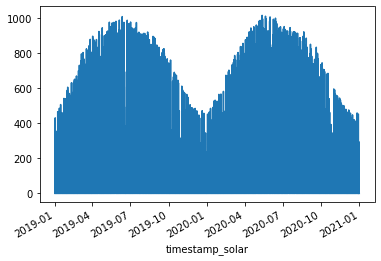

In [170]:
df.index = df['timestamp_solar'] 
df['ghi'].plot()

## Zooming In

In [171]:
# 5 day trend of data
df_z5 = df[(df['timestamp_solar'] > '2020-01-01 00:00:00+00:00') & (df['timestamp_solar'] <= '2020-01-06 00:00:00+00:00	')].copy()

<AxesSubplot:xlabel='timestamp_solar'>

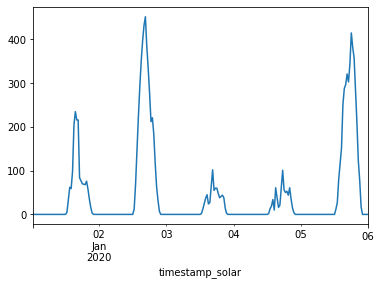

In [172]:
df_z5['ghi'].plot()

## Removing Seasonality

In [173]:
df['year'] = df['timestamp_solar'].dt.year

In [174]:
df['month'] = df['timestamp_solar'].dt.month

In [175]:
df['day'] = df['timestamp_solar'].dt.day

In [176]:
df.head()

,timestamp_solar,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,...,solar_zenith_angle,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed,year,month,day
timestamp_solar,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00+00:00,2020-01-01 00:00:00+00:00,4.2,1.39,0.0720,0.61,0.0,0.0,0.0,0.0,0.0,...,116.02,0.94,0.08,1003.0,1.3,231.0,2.6,2020,1,1
2020-01-01 00:30:00+00:00,2020-01-01 00:30:00+00:00,4.2,1.39,0.0720,0.61,0.0,0.0,0.0,0.0,0.0,...,121.66,0.94,0.08,1003.0,1.2,233.0,2.7,2020,1,1
2020-01-01 01:00:00+00:00,2020-01-01 01:00:00+00:00,4.2,1.38,0.0791,0.61,0.0,0.0,0.0,0.0,0.0,...,127.33,0.94,0.08,1003.0,1.2,235.0,2.7,2020,1,1
2020-01-01 01:30:00+00:00,2020-01-01 01:30:00+00:00,4.0,1.38,0.0791,0.61,0.0,0.0,0.0,0.0,0.0,...,133.00,0.94,0.08,1003.0,1.1,244.0,2.9,2020,1,1
2020-01-01 02:00:00+00:00,2020-01-01 02:00:00+00:00,3.9,1.41,0.0767,0.61,0.0,0.0,0.0,0.0,0.0,...,138.62,0.94,0.08,1003.0,1.1,252.0,3.0,2020,1,1


In [177]:
df['year'] = df['timestamp_solar'].dt.year

In [178]:
df.groupby('month')['ghi'].mean()

month
1      73.873656
2     104.202485
3     156.906250
4     179.158681
5     230.193884
6     259.230208
7     256.719422
8     223.904570
9     182.193056
10    109.173387
11     90.639583
12     60.861223
Name: ghi, dtype: float64

<AxesSubplot:xlabel='month'>

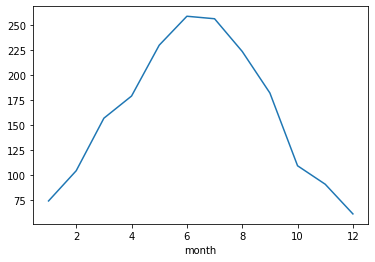

In [179]:
df.groupby('month')['ghi'].mean().plot()

<AxesSubplot:xlabel='day'>

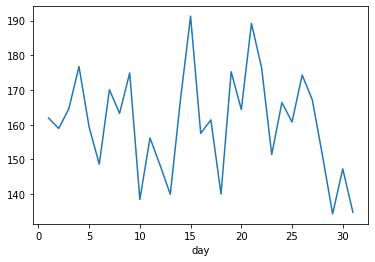

In [180]:
df.groupby('day')['ghi'].mean().plot()

In [181]:
df['lag1'] =  df['ghi'].shift(17520)

In [182]:
df.shape

(35088, 30)

In [183]:
df.head()

,timestamp_solar,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,...,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed,year,month,day,lag1
timestamp_solar,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00+00:00,2020-01-01 00:00:00+00:00,4.2,1.39,0.0720,0.61,0.0,0.0,0.0,0.0,0.0,...,0.94,0.08,1003.0,1.3,231.0,2.6,2020,1,1,NaN
2020-01-01 00:30:00+00:00,2020-01-01 00:30:00+00:00,4.2,1.39,0.0720,0.61,0.0,0.0,0.0,0.0,0.0,...,0.94,0.08,1003.0,1.2,233.0,2.7,2020,1,1,NaN
2020-01-01 01:00:00+00:00,2020-01-01 01:00:00+00:00,4.2,1.38,0.0791,0.61,0.0,0.0,0.0,0.0,0.0,...,0.94,0.08,1003.0,1.2,235.0,2.7,2020,1,1,NaN
2020-01-01 01:30:00+00:00,2020-01-01 01:30:00+00:00,4.0,1.38,0.0791,0.61,0.0,0.0,0.0,0.0,0.0,...,0.94,0.08,1003.0,1.1,244.0,2.9,2020,1,1,NaN
2020-01-01 02:00:00+00:00,2020-01-01 02:00:00+00:00,3.9,1.41,0.0767,0.61,0.0,0.0,0.0,0.0,0.0,...,0.94,0.08,1003.0,1.1,252.0,3.0,2020,1,1,NaN


<AxesSubplot:xlabel='lag1', ylabel='ghi'>

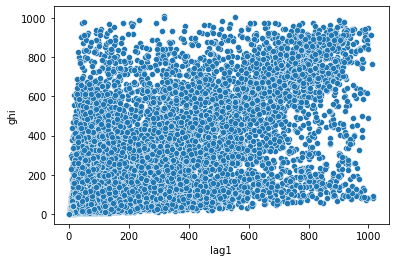

In [184]:
sns.scatterplot(x=df['lag1'], y=df['ghi'])

<AxesSubplot:xlabel='y(t)', ylabel='y(t + 1)'>

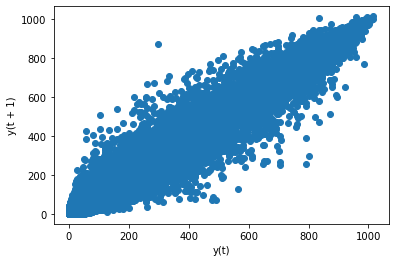

In [185]:
lag_plot(df['ghi'])

In [186]:
df.shape

(35088, 30)

# Autocorrelation Plots

<AxesSubplot:xlabel='Lag', ylabel='Autocorrelation'>

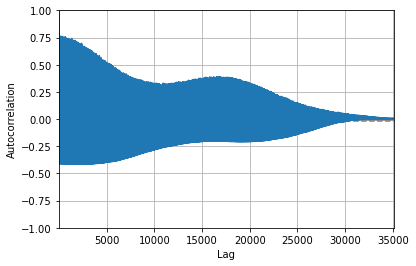

In [187]:
autocorrelation_plot(df['ghi'])

In [188]:
df.shape

(35088, 30)

# Partial Autocorrelation Graph

C:\Users\parit\Anaconda\envs\Capstone\lib\site-packages\statsmodels\graphics\tsaplots.py:353: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  FutureWarning,


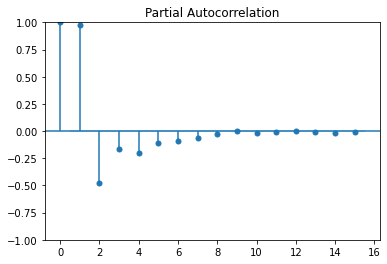

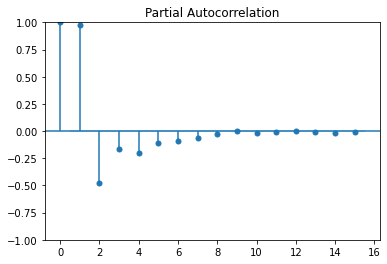

In [189]:
plot_pacf(df['ghi'], lags=15)

In [190]:
df.shape

(35088, 30)

In [191]:
#Quaterly Plot
quarterly_ghi_df = df.resample('Q', on='timestamp_solar').mean()

<AxesSubplot:xlabel='timestamp_solar'>

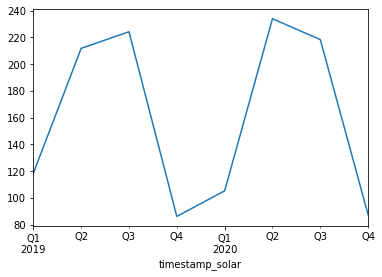

In [192]:
quarterly_ghi_df.ghi.plot()

In [193]:
df.shape

(35088, 30)

In [194]:
#Monthly Plot
monthly_ghi_df = df.resample('M', on='timestamp_solar').mean()

<AxesSubplot:xlabel='timestamp_solar'>

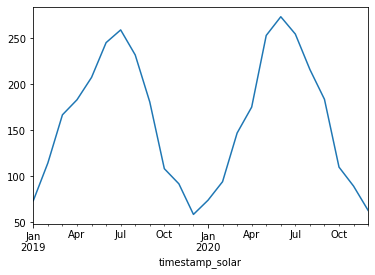

In [195]:
monthly_ghi_df.ghi.plot()

In [197]:
df.shape

(35088, 30)

# Decomposing Time Series

## Additive Model

y(t) = Level + Trend + Seasonality + Noise

In [198]:
df2 = df.set_index('timestamp_solar').asfreq('D')

In [199]:
result = seasonal_decompose(df2['ghi'], model='additive')

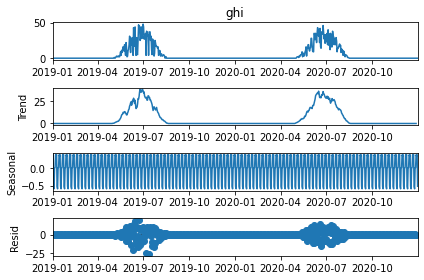

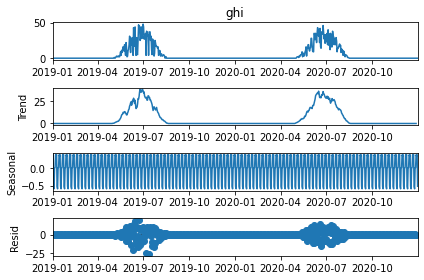

In [200]:
result.plot()

In [201]:
df.shape

(35088, 30)

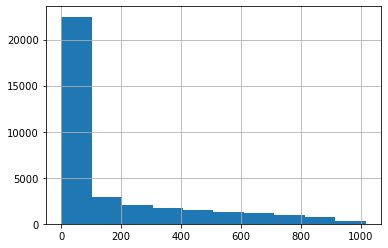

In [202]:

#series = read_csv('daily-minimum-temperatures.csv', header=0, index_col=0, parse_dates=True, squeeze=True)
df.ghi.hist()
pyplot.show()

# Missing Data

In [203]:
df1=df[['air_temperature', 'alpha', 'aod', 'asymmetry', 'cld_opd_dcomp',
       'cld_reff_dcomp', 'clearsky_dhi', 'clearsky_dni', 'clearsky_ghi',
       'cloud_press_acha', 'cloud_type', 'dew_point', 'dhi', 'dni',
       'fill_flag', 'ghi', 'ozone', 'relative_humidity', 'solar_zenith_angle',
       'ssa', 'surface_albedo', 'surface_pressure', 'total_precipitable_water',
       'wind_direction', 'wind_speed']]

In [204]:
df1.head()

,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,cloud_press_acha,...,ghi,ozone,relative_humidity,solar_zenith_angle,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed
timestamp_solar,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00+00:00,4.2,1.39,0.0720,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.351,94.22,116.02,0.94,0.08,1003.0,1.3,231.0,2.6
2020-01-01 00:30:00+00:00,4.2,1.39,0.0720,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.351,94.22,121.66,0.94,0.08,1003.0,1.2,233.0,2.7
2020-01-01 01:00:00+00:00,4.2,1.38,0.0791,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.350,94.85,127.33,0.94,0.08,1003.0,1.2,235.0,2.7
2020-01-01 01:30:00+00:00,4.0,1.38,0.0791,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.348,96.19,133.00,0.94,0.08,1003.0,1.1,244.0,2.9
2020-01-01 02:00:00+00:00,3.9,1.41,0.0767,0.61,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.347,94.09,138.62,0.94,0.08,1003.0,1.1,252.0,3.0


In [205]:
df1.shape

(35088, 25)

<AxesSubplot:>

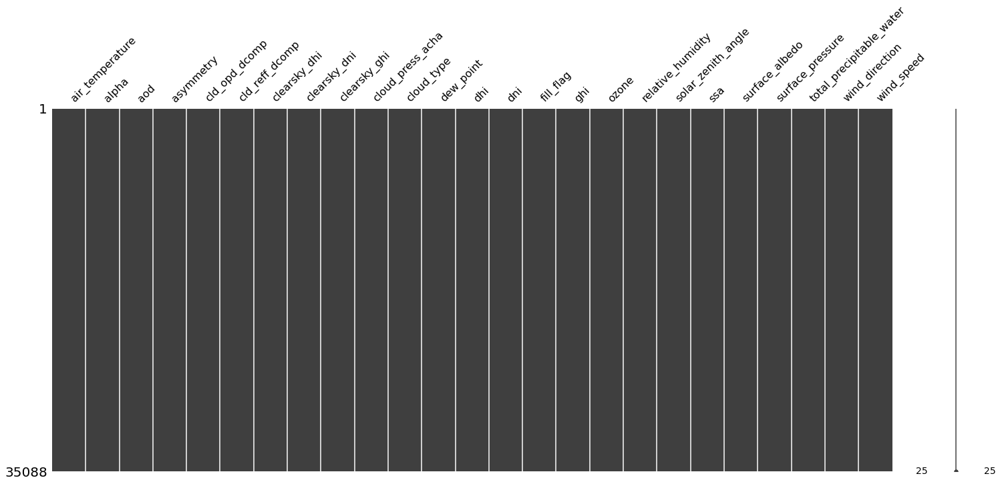

In [206]:
msno.matrix(df1)
# No missing data found

# Correlation

In [207]:
df1.corr()

,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,cloud_press_acha,...,ghi,ozone,relative_humidity,solar_zenith_angle,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed
air_temperature,1.000000,0.383299,0.446057,-0.692254,0.050941,0.058109,0.417524,0.272231,0.393575,0.101715,...,0.388831,-0.282731,-0.182112,-0.451078,0.228057,-0.270198,-0.285873,0.793416,-0.125823,-0.340447
alpha,0.383299,1.000000,0.345050,-0.366205,-0.161134,-0.101273,0.118922,0.023536,0.074646,-0.059502,...,0.150677,-0.046257,-0.157073,-0.112053,-0.247274,-0.073072,-0.035512,0.191780,0.117084,-0.407028
aod,0.446057,0.345050,1.000000,-0.169936,0.170457,0.134502,0.344258,-0.015011,0.129482,0.117042,...,0.037246,0.024427,0.148751,-0.192862,0.451937,-0.076514,-0.222811,0.541038,-0.161311,-0.205125
asymmetry,-0.692254,-0.366205,-0.169936,1.000000,0.056924,0.050173,-0.080624,-0.016128,-0.066246,0.032528,...,-0.106308,0.432939,0.098783,0.109876,-0.023308,0.157991,0.058304,-0.555485,0.079854,0.261045
cld_opd_dcomp,0.050941,-0.161134,0.170457,0.056924,1.000000,0.593491,0.398343,0.298320,0.271279,0.443453,...,-0.086648,-0.044908,0.059923,-0.315864,0.317419,0.007398,-0.184517,0.192042,-0.142505,0.150533
cld_reff_dcomp,0.058109,-0.101273,0.134502,0.050173,0.593491,1.000000,0.470584,0.434677,0.351557,0.603921,...,0.051405,-0.050628,-0.072953,-0.428828,0.254782,0.025601,-0.102422,0.141525,-0.141984,0.099312
clearsky_dhi,0.417524,0.118922,0.344258,-0.080624,0.398343,0.470584,1.000000,0.844664,0.905434,0.509899,...,0.721305,0.051381,-0.524780,-0.866725,0.169849,-0.020888,-0.107833,0.244904,-0.094680,-0.032304
clearsky_dni,0.272231,0.023536,-0.015011,-0.016128,0.298320,0.434677,0.844664,1.000000,0.910596,0.483206,...,0.802741,0.055743,-0.677015,-0.882942,-0.033916,-0.015174,-0.013483,0.013858,-0.009569,0.035168
clearsky_ghi,0.393575,0.074646,0.129482,-0.066246,0.271279,0.351557,0.905434,0.910596,1.000000,0.421304,...,0.879099,0.073747,-0.658670,-0.886420,0.045196,-0.035037,-0.063402,0.140603,-0.045575,-0.020221
cloud_press_acha,0.101715,-0.059502,0.117042,0.032528,0.443453,0.603921,0.509899,0.483206,0.421304,1.000000,...,0.156179,0.007688,-0.186362,-0.469792,0.225467,0.032393,-0.093445,0.104721,-0.076940,0.074802


## Correlation heat map

Text(0.5, 1.0, 'HeatMap-Correlation Matrix')

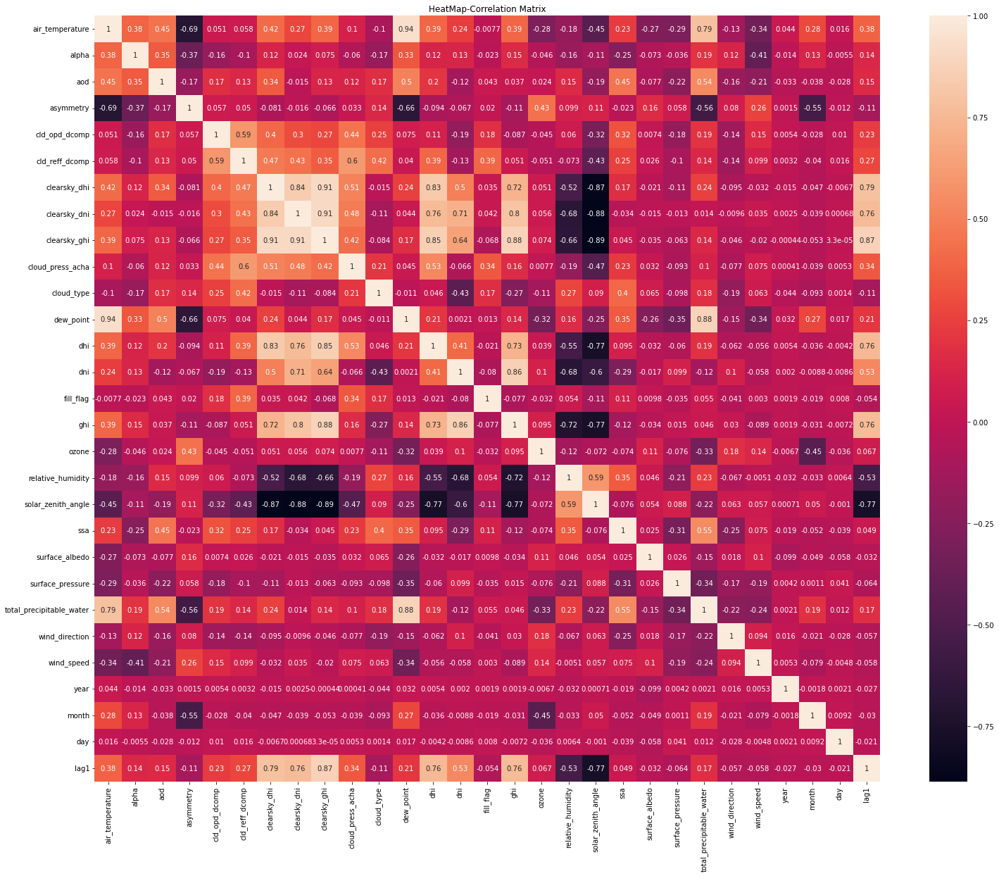

In [208]:
#heatmap - correlation matrix
plt.figure(figsize=(25, 20))
sns.heatmap(df.corr(), annot=True)
plt.title('HeatMap-Correlation Matrix')

# Box Plot

In [209]:
cont_summary = df1.describe()
cont_summary

,air_temperature,alpha,aod,asymmetry,cld_opd_dcomp,cld_reff_dcomp,clearsky_dhi,clearsky_dni,clearsky_ghi,cloud_press_acha,...,ghi,ozone,relative_humidity,solar_zenith_angle,ssa,surface_albedo,surface_pressure,total_precipitable_water,wind_direction,wind_speed
count,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,...,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000,35088.000000
mean,12.204765,1.295581,0.125158,0.603228,6.293431,3.800394,46.048564,336.023883,230.757866,137.900564,...,160.785283,0.314761,80.305861,89.683716,0.934635,0.111956,1015.441604,2.214241,200.742932,2.491174
std,9.663966,0.244773,0.100127,0.014877,16.844011,7.005680,56.190252,371.639415,301.939724,251.609387,...,248.002480,0.036716,15.362050,35.778902,0.026532,0.145616,7.905876,1.420377,98.062260,1.222156
min,-16.100000,0.120000,0.014500,0.580000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.208000,28.080000,17.290000,0.810000,0.060000,976.000000,0.100000,0.000000,0.100000
25%,4.100000,1.160000,0.057700,0.590000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.291000,69.870000,61.937500,0.920000,0.080000,1010.000000,1.000000,125.000000,1.600000
50%,12.000000,1.300000,0.097700,0.600000,0.000000,0.000000,8.000000,50.000000,9.000000,0.000000,...,5.000000,0.311000,83.310000,89.450000,0.940000,0.080000,1015.000000,1.900000,211.000000,2.300000
75%,20.600000,1.430000,0.162000,0.610000,2.370000,6.180000,86.000000,743.000000,453.000000,238.000000,...,252.000000,0.335000,93.410000,117.500000,0.950000,0.090000,1021.000000,3.300000,283.000000,3.100000
max,33.300000,2.130000,1.195600,0.630000,158.490000,80.000000,362.000000,1025.000000,1016.000000,1018.000000,...,1016.000000,0.467000,100.000000,162.680000,1.000000,0.870000,1040.000000,6.400000,360.000000,10.300000


In [210]:
#Continous Variable Column
cont_summary.columns

Index(['air_temperature', 'alpha', 'aod', 'asymmetry', 'cld_opd_dcomp',
       'cld_reff_dcomp', 'clearsky_dhi', 'clearsky_dni', 'clearsky_ghi',
       'cloud_press_acha', 'cloud_type', 'dew_point', 'dhi', 'dni',
       'fill_flag', 'ghi', 'ozone', 'relative_humidity', 'solar_zenith_angle',
       'ssa', 'surface_albedo', 'surface_pressure', 'total_precipitable_water',
       'wind_direction', 'wind_speed'],
      dtype='object')

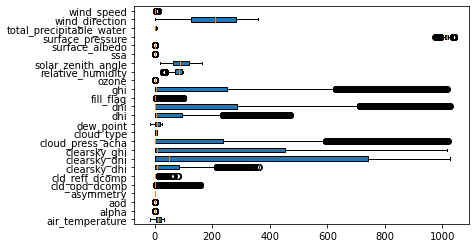

In [211]:
box_plot_data=[df.air_temperature, df.alpha, df.aod, df.asymmetry, df.cld_opd_dcomp,df.cld_reff_dcomp, df.clearsky_dhi,df.clearsky_dni,df.clearsky_ghi,df.cloud_press_acha,df.cloud_type,df.dew_point,df.dhi,df.dni,df.fill_flag, df.ghi, df.ozone,df.relative_humidity,df.solar_zenith_angle,df.ssa, df.surface_albedo, df.surface_pressure, df.total_precipitable_water,df.wind_direction,df.wind_speed]
plt.boxplot(box_plot_data,patch_artist=True, vert=0, labels=['air_temperature', 'alpha', 'aod', 'asymmetry', 'cld_opd_dcomp','cld_reff_dcomp', 'clearsky_dhi', 'clearsky_dni', 'clearsky_ghi','cloud_press_acha', 'cloud_type', 'dew_point', 'dhi', 'dni','fill_flag', 'ghi', 'ozone', 'relative_humidity', 'solar_zenith_angle','ssa', 'surface_albedo', 'surface_pressure', 'total_precipitable_water', 'wind_direction', 'wind_speed'])
plt.show()

<AxesSubplot:xlabel='ghi'>

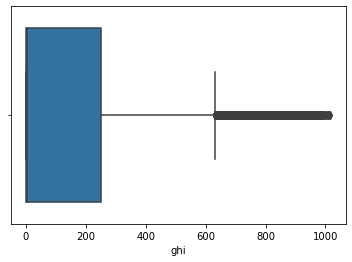

In [212]:
sns.boxplot(x=df['ghi'])

# Pairplot

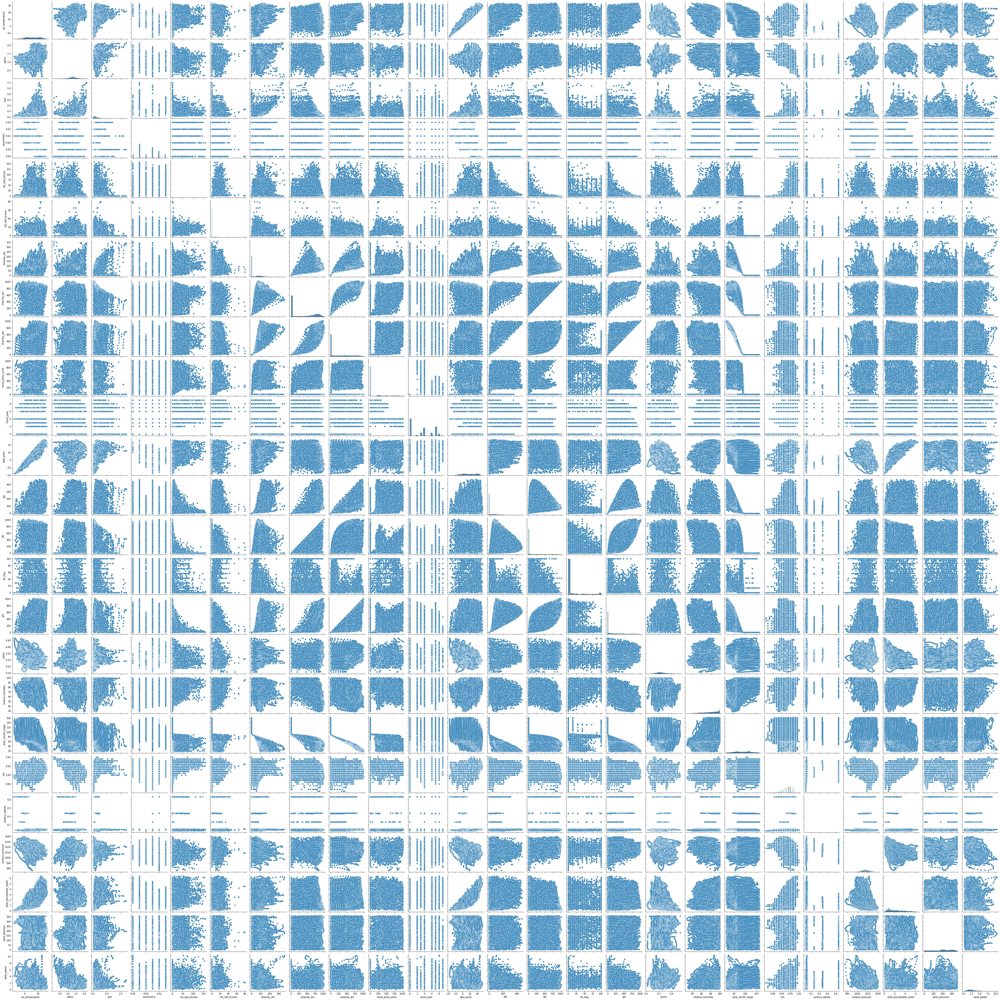

In [213]:
# Create the default pairplot
sns.pairplot(df1)

# Variable Distributions

In [1]:
df1.hist(figsize=(15,15)) 
#set a large figsize if you have > 9 variables
plt.tight_layout()
plt.show()

NameError: name 'df1' is not defined

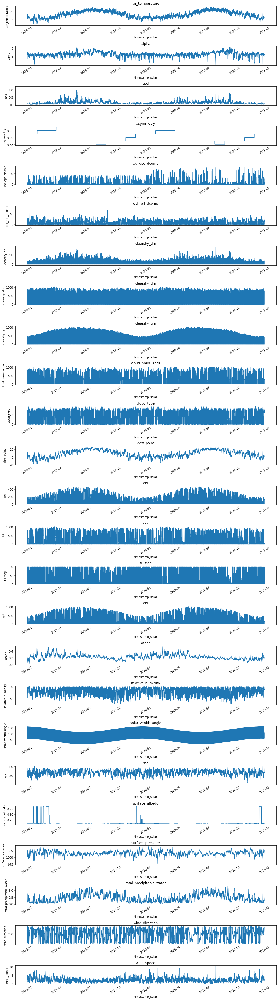

In [215]:
# Plot line charts
df_plot = df1.copy()

list_length = df_plot.shape[1]
ncols = 2
nrows = int(round(list_length / ncols, 0))

fig, ax = plt.subplots(nrows=nrows, ncols=ncols, sharex=True, figsize=(14, 50))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
for i in range(0, list_length):
        ax = plt.subplot(25,1,i+1)
        sns.lineplot(data = df_plot.iloc[:, i], ax=ax)
        ax.set_title(df_plot.columns[i])
        ax.tick_params(axis="x", rotation=30, labelsize=10, length=0)
       # ax.xaxis.set_major_locator(timestamp_solar.AutoDateLocator())
fig.tight_layout()
plt.show()

# Creating the Train and Validation set

In [228]:

train = df[:int(0.8*(len(df1)))]
valid = df[int(0.8*(len(df1))):]
print(train.shape)
print(valid.shape)

(28070, 30)
(7018, 30)


In [240]:
train_array = train[:]
print(train_array.shape)

test_array = valid[:]
print(test_array.shape)

(28070, 30)
(7018, 30)


## Check for stationarity of the time-series data

In [241]:

from statsmodels.tsa.stattools import adfuller

print("p-value:", adfuller(train.ghi.dropna())[1])

p-value: 1.0685440265312802e-23



The p-value now is below the significance level, indicating that the series is stationary.

The above plot can be used to determine the order of AR model. It is note that a correlation value up to order 7 is high enough. Thus, we will train the AR model of order 8.

In [242]:
#diff_1 = train_array.diff().dropna()
#print("p-value:", adfuller(diff_1.dropna())[1])

The p-value now is below the significance level, indicating that the series is stationary.

# VAR Model

Auto_arima function in Python will be used. Auto_arima function automatically discovers the optimal order for an ARIMA model. In simple terms, the function will automatically determine the parameters p, d’, and q of the ARIMA model.

In [243]:
#fit the model
from statsmodels.tsa.vector_ar.var_model import VAR

model = VAR(endog=train_array)
model_fit = model.fit()

# make prediction on validation
prediction = model_fit.forecast(model_fit.y, steps=len(valid))

ValueError: Pandas data cast to numpy dtype of object. Check input data with np.asarray(data).

Build the ARIMA estimator on the training data.

In [221]:
arima_model = arimamodel(train_array)
arima_model.summary()

TypeError: float() argument must be a string or a number, not 'Timestamp'

# fit the model

In [ ]:
from statsmodels.tsa.vector_ar.var_model import VAR

model = VAR(endog=train)
model_fit = model.fit()